# Imports 

In [13]:
import pandas as pd
import numpy as np
import cv2
import os
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image, ImageStat
from skimage import io
from sklearn.metrics import pairwise_distances

from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import img_to_array, load_img

from utils import display_top_images, plot_hamming_distance_distribution
from utils import find_identical_images, display_identical_images, flag_non_face_images
from utils import find_similar_images_by_thresholds, display_similar_images
from utils import find_exact_duplicates, delete_duplicates
from utils import detect_hog_outliers

## Introduction

**The Age and Gender Classification project focuses on building a deep learning model capable of predicting both age and gender from facial images using a multi-task learning approach.** In this task, the model is designed to perform two distinct but related classification tasks—age estimation and gender classification—simultaneously in one pass. Instead of training two separate models, multi-task learning allows us to leverage shared features between tasks, improving efficiency and often boosting performance on both tasks.

Multi-task learning refers to a machine learning paradigm where a model is trained to handle multiple tasks at once, sharing knowledge across these tasks. This approach is particularly advantageous for problems like age and gender classification, where both tasks can benefit from shared visual features of a face. Rather than independently optimizing for age and gender, the model's ability to learn from both tasks in parallel often results in better generalization and more robust predictions. More information about the benefits of multi-task learning can be found in [Ruder's multi-task learning overview](https://ruder.io/multi-task/).

Given that age and gender are sensitive personal attributes, this project also addresses ethical concerns. The fairness of the model is of paramount importance, particularly when used in real-world scenarios where biased predictions could lead to significant social implications. As part of this project, we will carefully evaluate the model's performance, interpret its predictions, and analyze potential biases. Understanding and mitigating biases in the training data and model predictions will be crucial to ensuring that the model is fair, unbiased, and suitable for deployment in ethical contexts.

# Exploratory Data Analysis

## Dataset Description

For this project, we use the [**UTKFace dataset**](https://www.kaggle.com/datasets/jangedoo/utkface-new) from Kaggle, a large-scale face dataset that spans a wide age range from 0 to 116 years. The dataset contains over 20,000 images of faces, each annotated with **age, gender**, and **ethnicity** labels. These labels are embedded in the file names and provide critical information for multi-task learning models to simultaneously predict both age and gender.

The UTKFace dataset offers significant diversity in the images, including variation in **pose, facial expressions, lighting conditions, occlusion**, and **resolution**. This diversity makes it well-suited for tasks such as **face detection, age estimation, age progression/regression**. Each image contains a single face, which is aligned and cropped, ensuring consistency in the data for training deep learning models.

**Labels**:
- **Age**: The age label is an integer ranging from 0 to 116, representing the age of the person in the image.
- **Gender**: Gender is labeled as either 0 (male) or 1 (female).
- **Ethnicity (Race)**: The race label is represented as an integer from 0 to 4, with categories as follows:
  - 0: White
  - 1: Black
  - 2: Asian
  - 3: Indian
  - 4: Others (including Hispanic, Latino, and Middle Eastern)

### Data Format:
The file naming convention embeds the labels in the filename, formatted as `[age]_[gender]_[race]_[date&time].jpg`. For example, a file named `25_0_3_201701191213.jpg` represents a 25-year-old male of Indian ethnicity, with the image taken on January 19th, 2017.

The UTKFace dataset's diversity and scale make it a robust resource for building multi-task models like the one required for this project. However, the inclusion of ethnicity in the labels also requires careful ethical consideration, as there is potential for biased predictions or unintended social implications, especially when dealing with sensitive attributes like race and gender. Understanding these biases and ensuring fairness in the model's predictions will be an essential aspect of this project.

## Metadata

In [2]:
folder_path = r"C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace"

file_names = []
file_paths = []
for root, _, files in os.walk(folder_path):
    for file in files:
        file_names.append(file)
        file_path = os.path.join(root, file).replace("\\", "/")
        file_paths.append(file_path)

print(f"Number of pictures in UTKFace dataset: {len(file_paths)}")

Number of pictures in UTKFace dataset: 23708


In [3]:
incorrect_files = []

def calculate_saturation(image):
    hsv_image = image.convert("HSV")
    stat = ImageStat.Stat(hsv_image)
    saturation = stat.mean[1]  
    return saturation

def calculate_blurriness(image):
    image_gray = np.array(image.convert('L'))  
    laplacian_var = cv2.Laplacian(image_gray, cv2.CV_64F).var()
    return laplacian_var

def extract_metadata_from_filename(file_name):
    try:
        name_parts = file_name.split('_')
        
        if len(name_parts) != 4:
            raise ValueError("Incorrect file name format")
        
        age = int(name_parts[0])
        gender = int(name_parts[1])
        race = int(name_parts[2])
        datetime_str = name_parts[3].split('.')[0] 
        check_14 = len(datetime_str) >= 14
        check_17 = len(datetime_str) == 17
        return age, gender, race, datetime_str, check_14, check_17
    except Exception as e:
        incorrect_files.append(file_name)
        raise ValueError(f"Malformed file name: {file_name} - {str(e)}")

def extract_metadata(folder_path):
    metadata = []
    race_map = {"0": "White", "1": "Black", "2": "Asian", "3": "Indian", "4": "Others"}

    for file_name in os.listdir(folder_path):
        if file_name.endswith(".jpg"): 
            file_path = os.path.join(folder_path, file_name)
            try:
                image = Image.open(file_path)
                
                image_size_kb = os.path.getsize(file_path) / 1024 
                image_width, image_height = image.size
                image_mode = image.mode
                image_format = image.format
                
                avg_saturation = calculate_saturation(image)
                blurriness = calculate_blurriness(image)
                
                age, gender, race, datetime_str, check_14, check_17 = extract_metadata_from_filename(file_name)
                
                metadata.append({
                    "file_name": file_name,
                    "size_kB": image_size_kb,
                    "height": image_height,
                    "width": image_width,
                    "mode": image_mode,
                    "format": image_format,
                    "avg_saturation": avg_saturation,
                    "blurriness": blurriness,
                    "age": age,
                    "gender": gender,
                    "race": race_map[str(race)],
                    "datetime": datetime_str,
                    "check_14": check_14,
                    "check_17": check_17
                })
            except ValueError as ve:
                print(ve)  

    df = pd.DataFrame(metadata)
    return df

metadata_df = extract_metadata(folder_path)

metadata_df.head()

if incorrect_files:
    print("Incorrect file names that were skipped:")
    print(incorrect_files)
else:
    print("No incorrect file names found.")

Malformed file name: 39_1_20170116174525125.jpg.chip.jpg - Incorrect file name format
Malformed file name: 61_1_20170109142408075.jpg.chip.jpg - Incorrect file name format
Malformed file name: 61_1_20170109150557335.jpg.chip.jpg - Incorrect file name format
Incorrect file names that were skipped:
['39_1_20170116174525125.jpg.chip.jpg', '61_1_20170109142408075.jpg.chip.jpg', '61_1_20170109150557335.jpg.chip.jpg']


In [4]:
metadata_df.head()

,file_name,size_kB,height,width,mode,format,avg_saturation,blurriness,age,gender,race,datetime,check_14,check_17
0,100_0_0_20170112213500903.jpg.chip.jpg,7.730469,200,200,RGB,JPEG,50.469125,542.650015,100,0,White,20170112213500903,True,True
1,100_0_0_20170112215240346.jpg.chip.jpg,7.039062,200,200,RGB,JPEG,46.079850,236.996828,100,0,White,20170112215240346,True,True
2,100_1_0_20170110183726390.jpg.chip.jpg,8.806641,200,200,RGB,JPEG,85.099050,732.333826,100,1,White,20170110183726390,True,True
3,100_1_0_20170112213001988.jpg.chip.jpg,7.015625,200,200,RGB,JPEG,46.303525,456.398828,100,1,White,20170112213001988,True,True
4,100_1_0_20170112213303693.jpg.chip.jpg,7.452148,200,200,RGB,JPEG,57.957225,410.240375,100,1,White,20170112213303693,True,True


In [5]:
metadata_df.tail()

,file_name,size_kB,height,width,mode,format,avg_saturation,blurriness,age,gender,race,datetime,check_14,check_17
23700,9_1_3_20161220222856346.jpg.chip.jpg,6.088867,200,200,RGB,JPEG,101.112925,98.640935,9,1,Indian,20161220222856346,True,True
23701,9_1_3_20170104222949455.jpg.chip.jpg,4.921875,200,200,RGB,JPEG,109.986050,26.105515,9,1,Indian,20170104222949455,True,True
23702,9_1_4_20170103200637399.jpg.chip.jpg,6.558594,200,200,RGB,JPEG,84.378525,417.811464,9,1,Others,20170103200637399,True,True
23703,9_1_4_20170103200814791.jpg.chip.jpg,6.561523,200,200,RGB,JPEG,107.565350,237.753765,9,1,Others,20170103200814791,True,True
23704,9_1_4_20170103213057382.jpg.chip.jpg,5.842773,200,200,RGB,JPEG,116.052225,69.413069,9,1,Others,20170103213057382,True,True


In [6]:
metadata_df.describe()

,size_kB,height,width,avg_saturation,blurriness,age,gender
count,23705.000000,23705.0,23705.0,23705.000000,23705.000000,23705.000000,23705.000000
mean,4.942352,200.0,200.0,98.843448,67.826370,33.300907,0.477283
std,0.806115,0.0,0.0,34.042717,122.369874,19.885708,0.499494
min,2.011719,200.0,200.0,0.000000,1.292492,1.000000,0.000000
25%,4.402344,200.0,200.0,79.425075,18.879849,23.000000,0.000000
50%,4.855469,200.0,200.0,99.391025,33.533923,29.000000,0.000000
75%,5.366211,200.0,200.0,119.903975,63.578091,45.000000,1.000000
max,11.743164,200.0,200.0,239.458850,4697.421726,116.000000,1.000000


In [7]:
metadata_df.nunique()

file_name         23705
size_kB            3878
height                1
width                 1
mode                  1
format                1
avg_saturation    22639
blurriness        23315
age                 104
gender                2
race                  5
datetime          23479
check_14              1
check_17              2
dtype: int64

In [8]:
metadata_df.check_17.value_counts()

check_17
True     23700
False        5
Name: count, dtype: int64

In [9]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23705 entries, 0 to 23704
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   file_name       23705 non-null  object 
 1   size_kB         23705 non-null  float64
 2   height          23705 non-null  int64  
 3   width           23705 non-null  int64  
 4   mode            23705 non-null  object 
 5   format          23705 non-null  object 
 6   avg_saturation  23705 non-null  float64
 7   blurriness      23705 non-null  float64
 8   age             23705 non-null  int64  
 9   gender          23705 non-null  int64  
 10  race            23705 non-null  object 
 11  datetime        23705 non-null  object 
 12  check_14        23705 non-null  bool   
 13  check_17        23705 non-null  bool   
dtypes: bool(2), float64(3), int64(4), object(5)
memory usage: 2.2+ MB


In [10]:
check_17_false_row = metadata_df[metadata_df['check_17'] == False]

check_17_false_row.head()

,file_name,size_kB,height,width,mode,format,avg_saturation,blurriness,age,gender,race,datetime,check_14,check_17
476,14_0_0_2017011022340900.jpg.chip.jpg,4.490234,200,200,RGB,JPEG,107.257375,14.604257,14,0,White,2017011022340900,True,False
4248,24_0_1_20170116220224657 .jpg.chip.jpg,4.328125,200,200,RGB,JPEG,112.755225,13.508025,24,0,Black,20170116220224657,True,False
9338,28_1_2_201701161846515488.jpg.chip.jpg,4.651367,200,200,RGB,JPEG,103.743500,18.934200,28,1,Asian,201701161846515488,True,False
14557,38_0_1_201701162330572788.jpg.chip.jpg,5.129883,200,200,RGB,JPEG,88.524225,29.099172,38,0,Black,201701162330572788,True,False
19232,55_0_0_20170116232725357jpg.chip.jpg,3.936523,200,200,RGB,JPEG,113.466100,8.346905,55,0,White,20170116232725357jpg,True,False


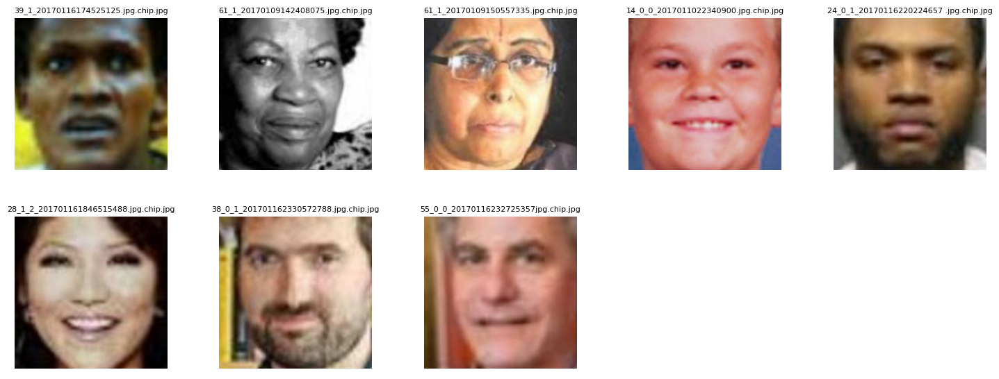

In [11]:
incorrect_files.extend(check_17_false_row['file_name'].tolist())

def display_images(image_list, folder_path, rows=2, cols=5):
    fig, axes = plt.subplots(rows, cols, figsize=(15, 6))  
    fig.tight_layout(pad=2.0)  

    for i, ax in enumerate(axes.flat):
        if i < len(image_list):
            img_path = os.path.join(folder_path, image_list[i])
            img = Image.open(img_path)
            ax.imshow(img)
            ax.set_title(image_list[i], fontsize=8) 
            ax.axis('off') 
        else:
            ax.axis('off')  
    
    plt.show()

display_images(incorrect_files[:10], folder_path)

In [12]:
def delete_incorrect_images(folder_path, malformed_files):
    deleted_files = []
    if malformed_files:
        for file_name in malformed_files:
            file_path = os.path.join(folder_path, file_name)
            try:
                os.remove(file_path)
                deleted_files.append(file_name)
                print(f"Deleted: {file_name}")
            except Exception as e:
                print(f"Error deleting file {file_name}: {e}")
    else:
        print("No incorrect files to delete.")
    return deleted_files

folder_path = r"C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace"

deleted_files = delete_incorrect_images(folder_path, incorrect_files)

print(f"Deleted {len(deleted_files)} malformed files.")

Deleted: 39_1_20170116174525125.jpg.chip.jpg
Deleted: 61_1_20170109142408075.jpg.chip.jpg
Deleted: 61_1_20170109150557335.jpg.chip.jpg
Deleted: 14_0_0_2017011022340900.jpg.chip.jpg
Deleted: 24_0_1_20170116220224657 .jpg.chip.jpg
Deleted: 28_1_2_201701161846515488.jpg.chip.jpg
Deleted: 38_0_1_201701162330572788.jpg.chip.jpg
Deleted: 55_0_0_20170116232725357jpg.chip.jpg
Deleted 8 malformed files.


These images should not be included in the deep learning model due to their incorrect naming conventions. The file names in this dataset encode critical metadata such as age, gender, and race, which are used to train the model. Malformed file names, such as the ones found in this dataset, do not follow the expected format and either lack key information or include additional erroneous data. As a result, these files cannot provide valid labels for training and would introduce noise or errors into the model, reducing its overall accuracy and reliability. Therefore, it is essential to exclude them from the dataset before training to maintain data integrity and ensure proper model evaluation.

C:\Users\Liberty\AppData\Local\Temp\ipykernel_29368\1381019131.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(data=metadata_df, x='gender', palette="Blues_r")


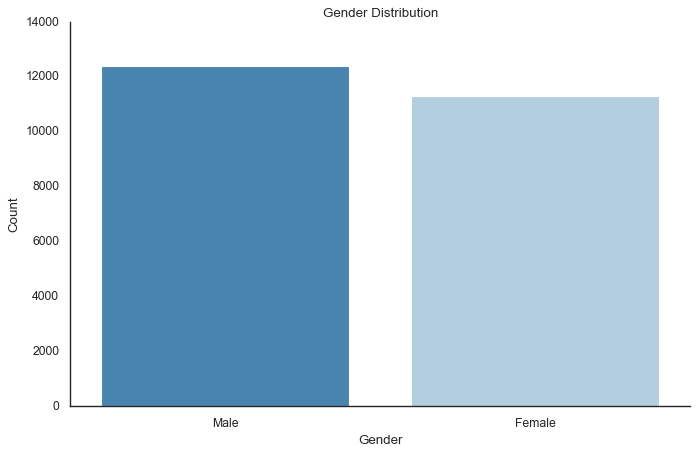

In [19]:
sns.set(style="white")

plt.figure(figsize=(10, 6))
ax = sns.countplot(data=metadata_df, x='gender', palette="Blues_r")
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Male', 'Female'])

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()

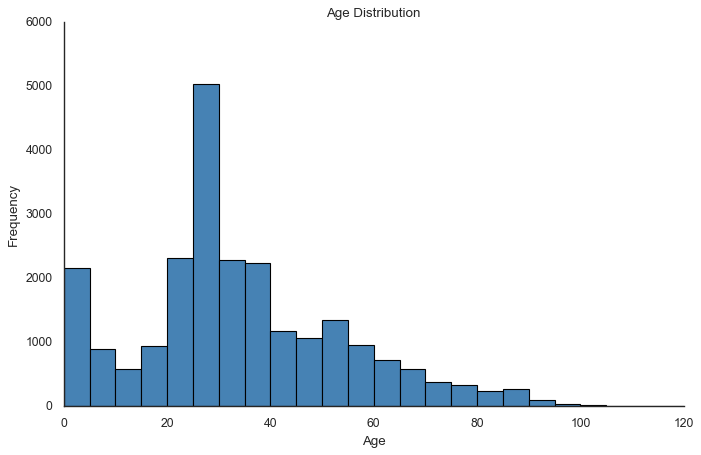

In [20]:
plt.figure(figsize=(10, 6))
ax = plt.gca() 
plt.hist(metadata_df['age'], bins=range(0, 121, 5), edgecolor='black', color='steelblue')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()

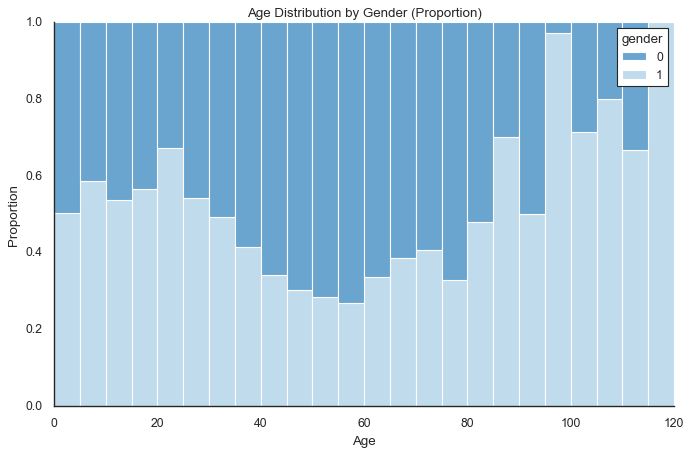

In [21]:
plt.figure(figsize=(10, 6))
ax = sns.histplot(data=metadata_df, x='age', hue='gender', multiple='fill', bins=range(0, 121, 5), palette="Blues_r")
plt.title('Age Distribution by Gender (Proportion)')
plt.xlabel('Age')
plt.ylabel('Proportion')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()

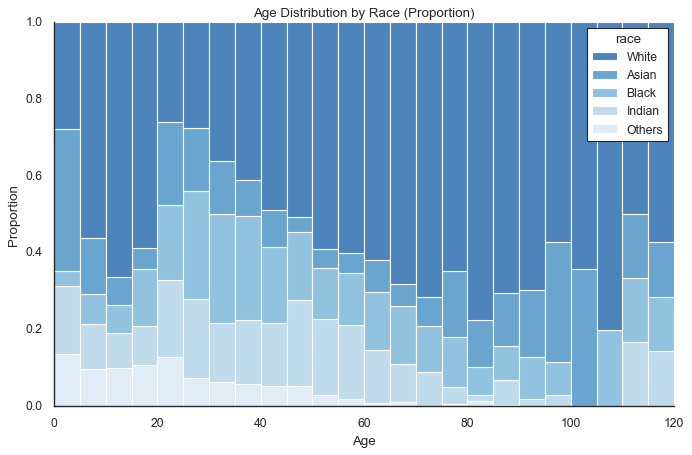

In [22]:
plt.figure(figsize=(10, 6))
ax = sns.histplot(data=metadata_df, x='age', hue='race', multiple='fill', bins=range(0, 121, 5), palette="Blues_r")
plt.title('Age Distribution by Race (Proportion)')
plt.xlabel('Age')
plt.ylabel('Proportion')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()

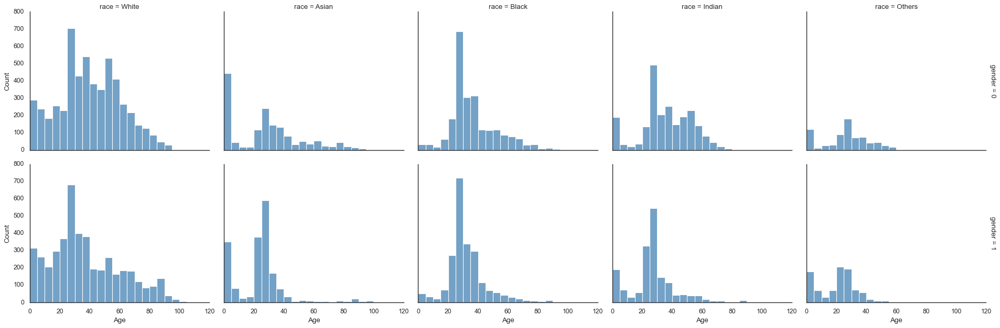

In [23]:
sns.set(style="white")
palette = "Blues_r"

g = sns.FacetGrid(metadata_df, row="gender", col="race", margin_titles=True, height=4, aspect=1.2, palette=palette)

g.map(sns.histplot, "age", bins=range(0, 121, 5), color="steelblue")

g.set_axis_labels("Age", "Count")
g.set_titles(col_template="race = {col_name}", row_template="gender = {row_name}")

for ax in g.axes.flat:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()

plt.show()

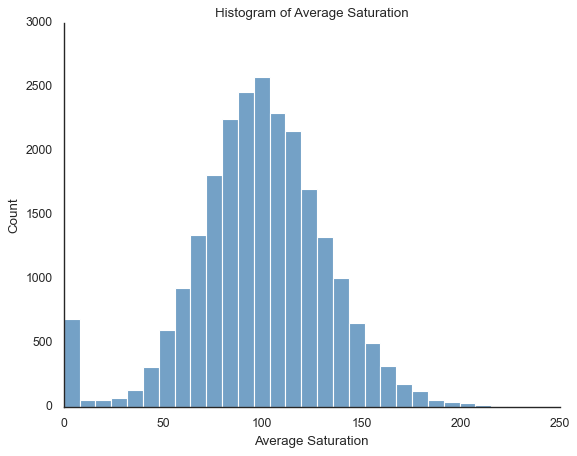

In [25]:
sns.set(style="white")
palette = "Blues_r"

plt.figure(figsize=(8, 6))
sns.histplot(data=metadata_df, x="avg_saturation", bins=30, color="steelblue")
plt.title("Histogram of Average Saturation")
plt.xlabel("Average Saturation")
plt.ylabel("Count")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

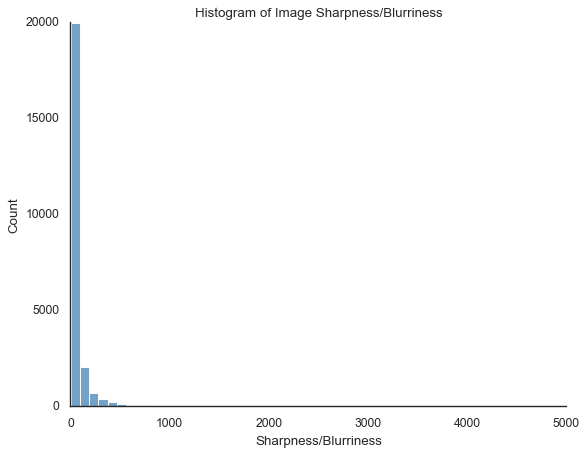

In [33]:
plt.figure(figsize=(8, 6))
sns.histplot(data=metadata_df, x="blurriness", bins=50, color="steelblue")
plt.title("Histogram of Image Sharpness/Blurriness")
plt.xlabel("Sharpness/Blurriness")
plt.ylabel("Count")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

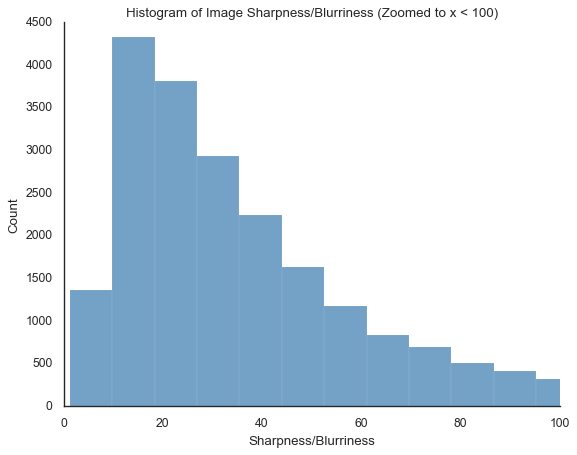

In [39]:
plt.figure(figsize=(8, 6))
sns.histplot(data=metadata_df, x="blurriness", bins=550, color="steelblue")
plt.title("Histogram of Image Sharpness/Blurriness (Zoomed to x < 100)")
plt.xlabel("Sharpness/Blurriness")
plt.ylabel("Count")
plt.xlim(0, 100) 
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

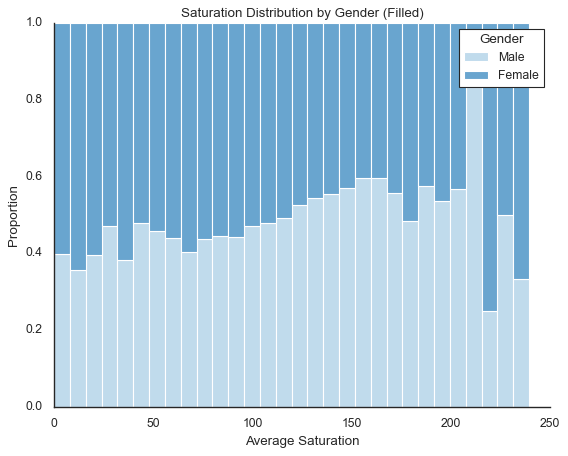

In [27]:
plt.figure(figsize=(8, 6))
sns.histplot(data=metadata_df, x="avg_saturation", hue="gender", bins=30, multiple="fill", palette=palette)
plt.title("Saturation Distribution by Gender (Filled)")
plt.xlabel("Average Saturation")
plt.ylabel("Proportion")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend(title="Gender", labels=["Male", "Female"])

plt.show()

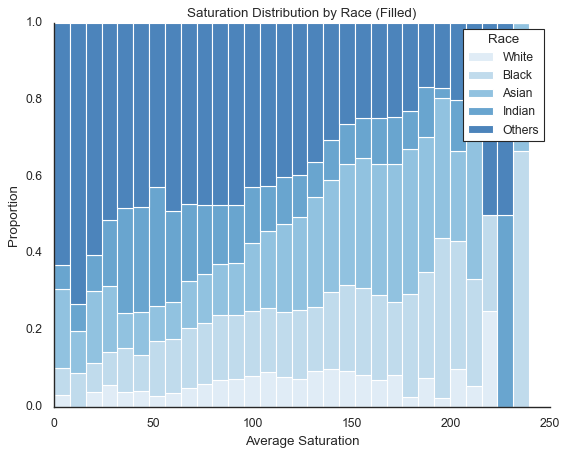

In [28]:
plt.figure(figsize=(8, 6))
sns.histplot(data=metadata_df, x="avg_saturation", hue="race", bins=30, multiple="fill", palette=palette)
plt.title("Saturation Distribution by Race (Filled)")
plt.xlabel("Average Saturation")
plt.ylabel("Proportion")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend(title="Race", labels=["White", "Black", "Asian", "Indian", "Others"])

plt.show()

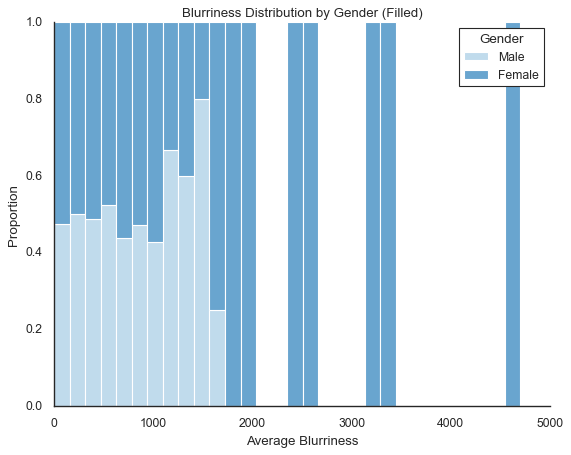

In [40]:
plt.figure(figsize=(8, 6))
sns.histplot(data=metadata_df, x="blurriness", hue="gender", bins=30, multiple="fill", palette=palette)
plt.title("Blurriness Distribution by Gender (Filled)")
plt.xlabel("Average Blurriness")
plt.ylabel("Proportion")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend(title="Gender", labels=["Male", "Female"])

plt.show()

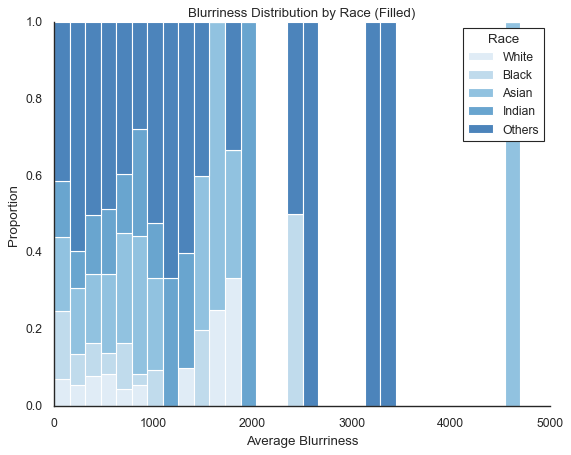

In [41]:
plt.figure(figsize=(8, 6))
sns.histplot(data=metadata_df, x="blurriness", hue="race", bins=30, multiple="fill", palette=palette)
plt.title("Blurriness Distribution by Race (Filled)")
plt.xlabel("Average Blurriness")
plt.ylabel("Proportion")
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.legend(title="Race", labels=["White", "Black", "Asian", "Indian", "Others"])

plt.show()

### Metadata Insights

All the images have a heigh and width of 200x200 pixels, JPEG format, and RGB mode. Gender is fairly evenly distributed with about 47.7% male and 52.3% female images.

> Blurriness 

- The images show some variation in the sharpness or blurriness, with certain races or genders having a higher proportion of blurry images. Specifically:
- Blurriness values span a wide range, but the vast majority of images have relatively low blurriness (under 1000).
- There are notable sharp images (higher sharpness values) across all groups, but a higher distribution of blurriness is observed in certain categories (e.g., "Others" race category).
- Males tend to have slightly more sharp images compared to females based on the blurriness distribution by gender.
- Mean blurriness is around 67.83, but this feature has a wide distribution with many outliers. The majority of images are relatively sharp (as seen from the zoomed histogram).
- The dataset shows high variance in sharpness/blurriness. The minimum blurriness starts at 1.29, and some images go as high as 4,697, indicating a wide range of image quality.
   
> Saturation 

- Average saturation for the images ranges from 0 to about 250, with a fairly even distribution across all race and gender categories.
- The saturation values show a tendency for most images to be in the 80–120 range.
- There appears to be a slightly higher variation of saturation values in certain racial groups (e.g., “Others” race category) compared to others.
- Mean saturation is 98.84, with most images having saturation levels between 79 and 120. There are a few images with extremely low saturation, potentially grayscale images.
   
> Age Distribution by Race and Gender

- **Age vs Race:**

  - The dataset includes a wide range of ages (1–116), with the highest concentrations around ages 20–40 for most racial categories.
  - There are fewer very young (< 10) and very old (> 90) images. White and Black racial groups have relatively more images in these extremes.
  - The race distribution is imbalanced, with more representation from White and Black individuals compared to others.
   
- **Age vs Gender:**

  - The distribution of age across genders is fairly similar, although males tend to be slightly more represented across age groups.
  - Females appear slightly under-represented in certain age categories, such as younger age groups (under 30) and older age groups (over 80).
  - Both genders have a broad age distribution, but with more dense clusters in the 20-40 age range.

## Visual Inspection

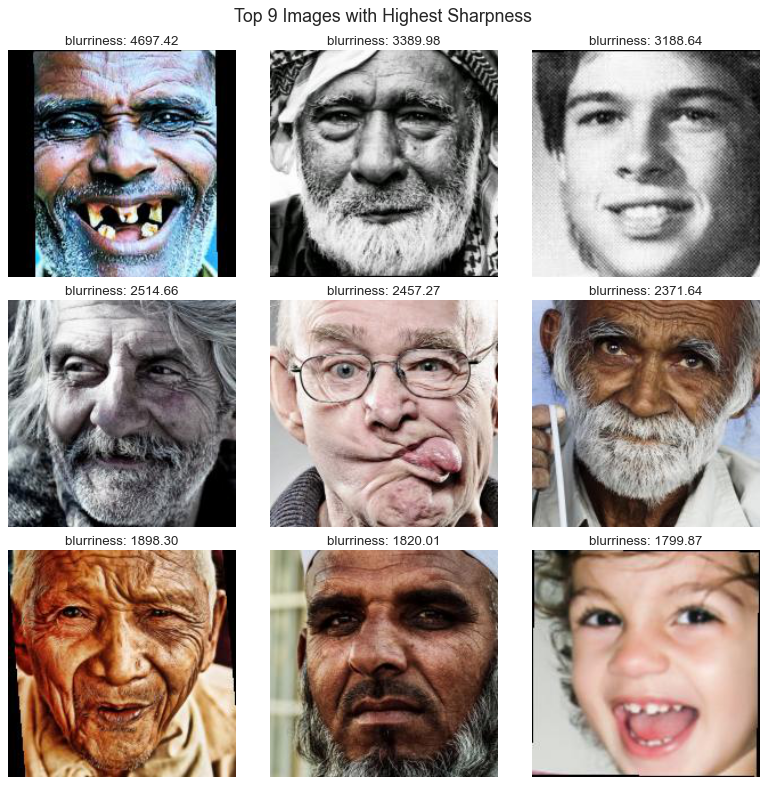

In [43]:
top_9_highest_sharpness = metadata_df.nlargest(9, 'blurriness')
display_top_images(top_9_highest_sharpness, 'blurriness', folder_path, "Top 9 Images with Highest Sharpness")

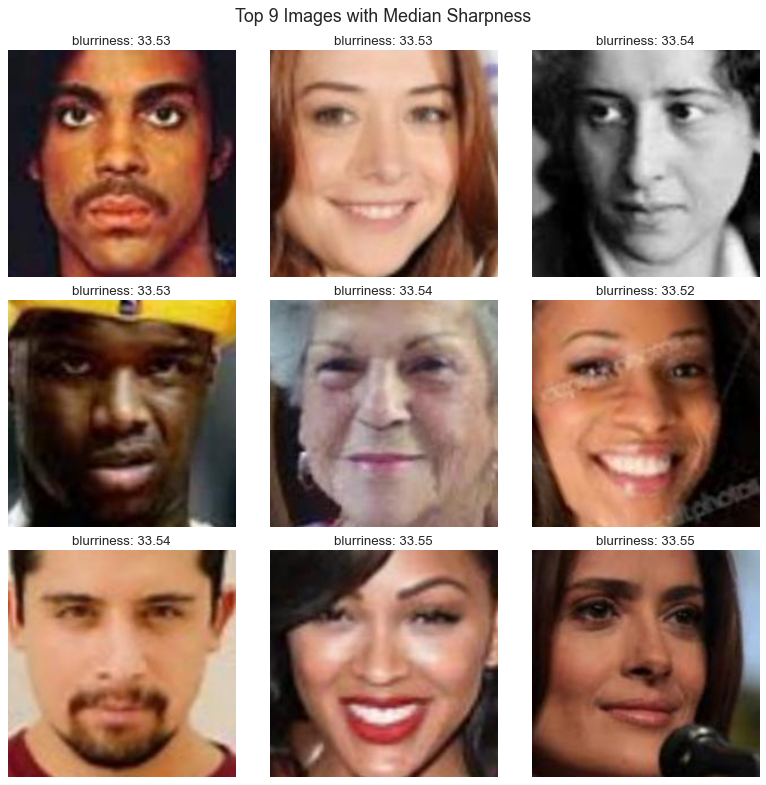

In [44]:
median_sharpness_value = metadata_df['blurriness'].median()
top_9_median_sharpness = metadata_df.iloc[(metadata_df['blurriness'] - median_sharpness_value).abs().argsort()[:9]]

display_top_images(top_9_median_sharpness, 'blurriness', folder_path, "Top 9 Images with Median Sharpness")

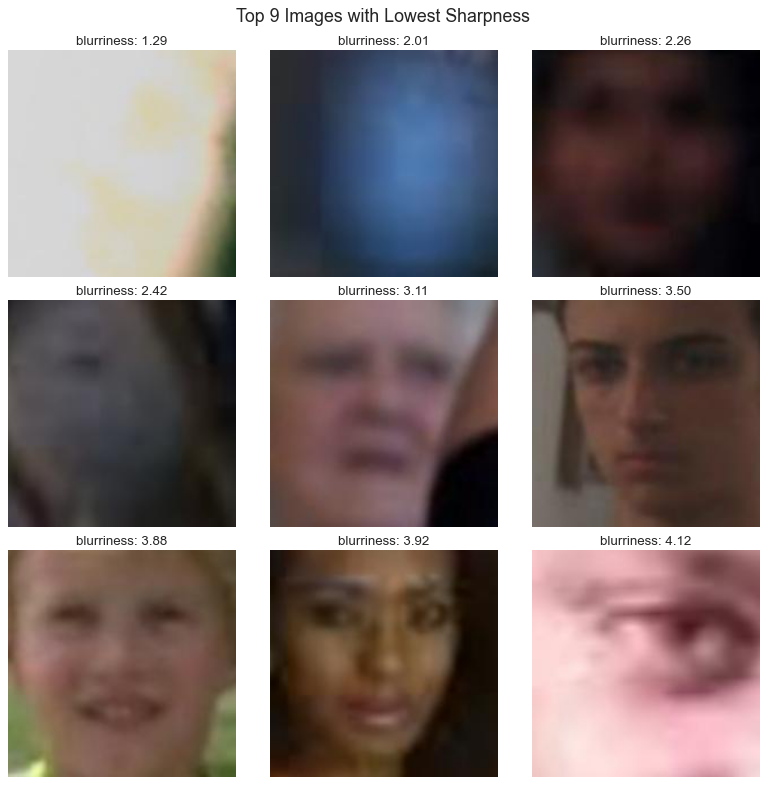

In [45]:
top_9_lowest_sharpness = metadata_df.nsmallest(9, 'blurriness')
display_top_images(top_9_lowest_sharpness, 'blurriness', folder_path, "Top 9 Images with Lowest Sharpness")

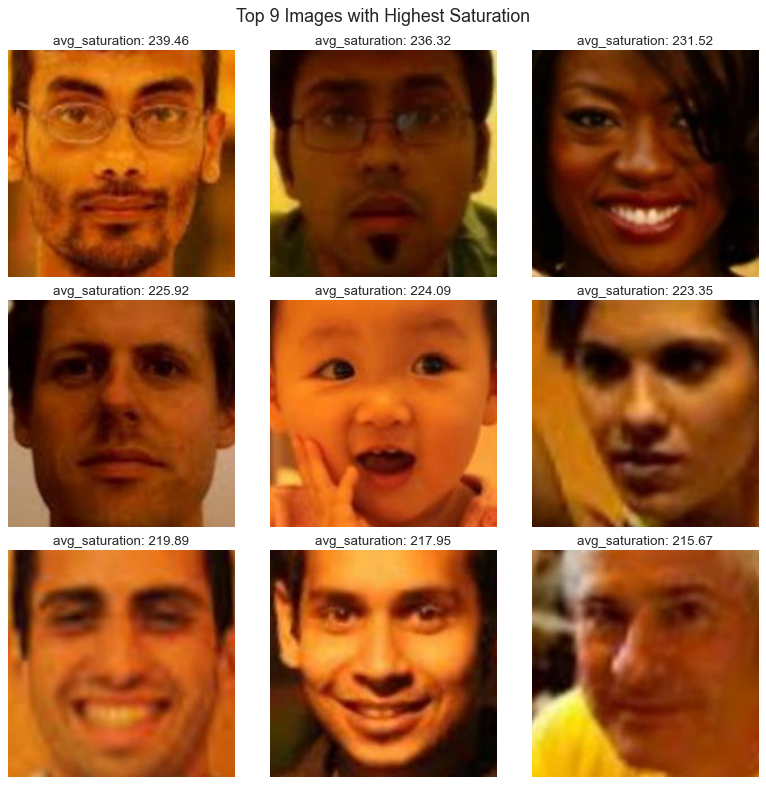

In [46]:
top_9_highest_saturation = metadata_df.nlargest(9, 'avg_saturation')
display_top_images(top_9_highest_saturation, 'avg_saturation', folder_path, "Top 9 Images with Highest Saturation")

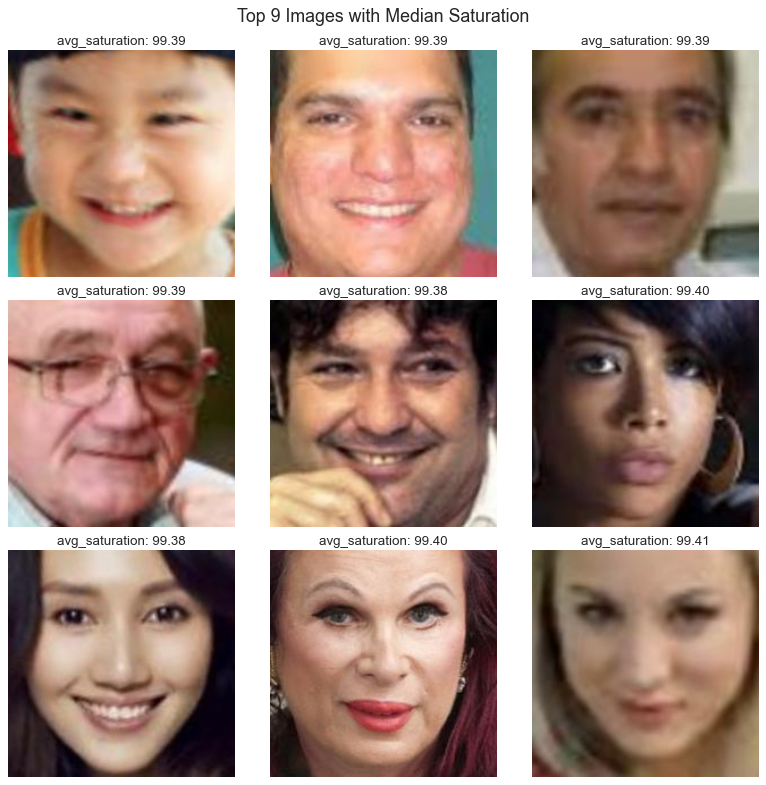

In [47]:
median_saturation_value = metadata_df['avg_saturation'].median()
top_9_median_saturation = metadata_df.iloc[(metadata_df['avg_saturation'] - median_saturation_value).abs().argsort()[:9]]

display_top_images(top_9_median_saturation, 'avg_saturation', folder_path, "Top 9 Images with Median Saturation")

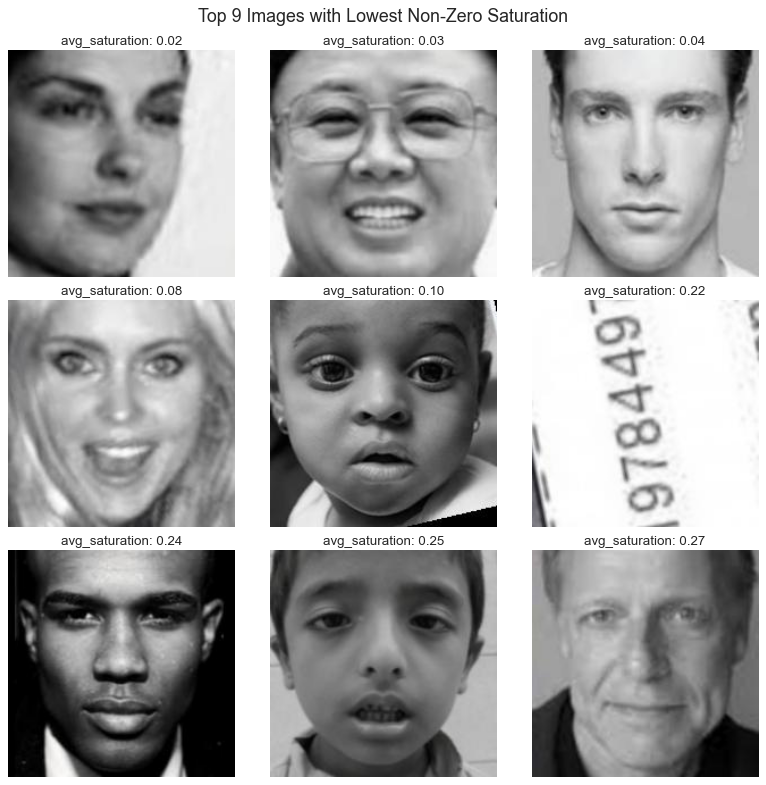

In [48]:
top_9_lowest_nonzero_saturation = metadata_df[metadata_df['avg_saturation'] > 0].nsmallest(9, 'avg_saturation')
display_top_images(top_9_lowest_nonzero_saturation, 'avg_saturation', folder_path, "Top 9 Images with Lowest Non-Zero Saturation")

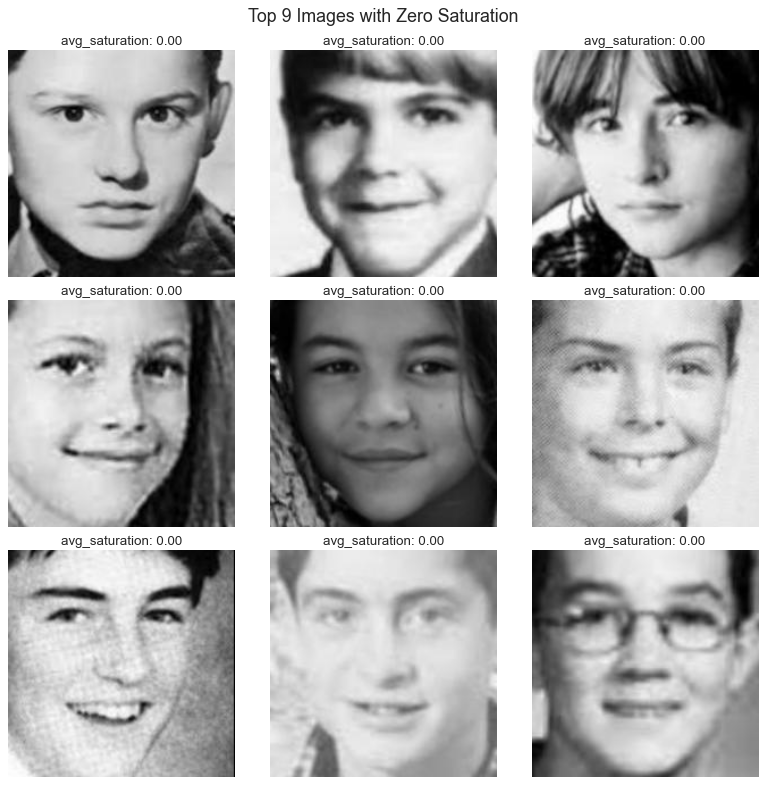

In [49]:
top_9_zero_saturation = metadata_df[metadata_df['avg_saturation'] == 0].nlargest(9, 'avg_saturation')
display_top_images(top_9_zero_saturation, 'avg_saturation', folder_path, "Top 9 Images with Zero Saturation")

### Visual Inspection Insights

1. **Sharpness**:
   - Top 9 Highest: These images exhibit very detailed facial features with high clarity. Some images have sharp textures, potentially indicating good focus. However, a few appear somewhat exaggerated in texture, perhaps due to the high blurriness metric or noise in the dataset.
   - Median: These images present a balance between clarity and smoothness, likely representing the typical image quality across the dataset. The features are discernible but without the extreme sharpness observed in the high sharpness group.
   - Lowest: These images are highly blurred, with facial features difficult to distinguish. Such images could negatively impact model training as they might lack important details for accurate classification.

2. **Saturation**:
   - Top 9 Highest : These images have very vivid and pronounced colors, which might indicate well-lit conditions or image editing. The bright tones could impact model behavior, especially for tasks involving color-based features.
   - Median: These images show balanced, natural color levels. This likely represents the dataset's typical range of saturation and is most representative of normal image conditions.
   - Lowest Non-Zero: These images are nearly desaturated but retain small amounts of color. They could indicate low-light conditions or grayscale-like images with slight color tints, which might make distinguishing certain features (like skin tone) more difficult.
   - Zero: These images are fully grayscale, which could pose challenges for models expecting color information. The absence of color might impact gender or race classification, as certain features may rely on color differentiation.

## Checking at Similarities

In [50]:
file_names = []

for file_name in os.listdir(folder_path):
    if file_name.endswith(".jpg"): 
        file_names.append(file_name)

file_name_counts = Counter(file_names)

for file_name, count in file_name_counts.items():
    if count > 1:
        print(f"File '{file_name}' is repeated {count} times.")

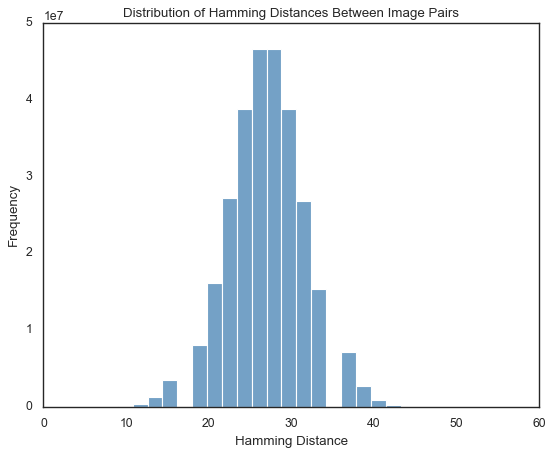

In [52]:
plot_hamming_distance_distribution(folder_path)

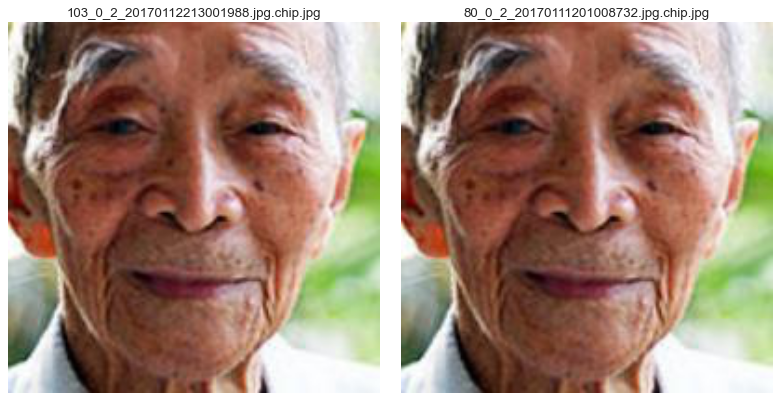

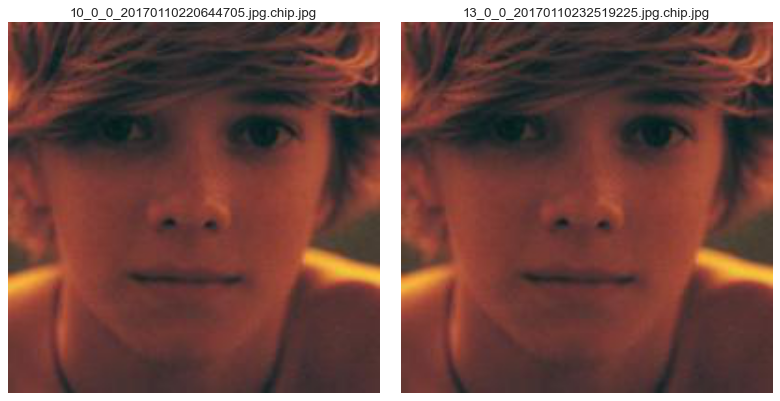

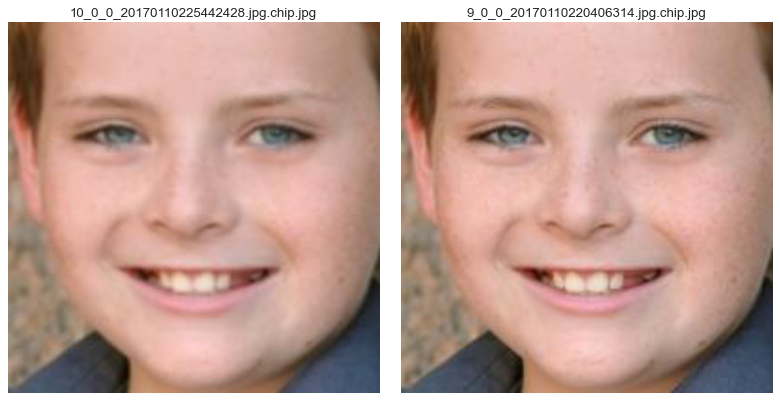

In [55]:
identical_images = find_identical_images(folder_path)

if identical_images:
    display_identical_images(identical_images[:3], folder_path) 
else:
    print("No identical images found.")

Displaying images for: Very Similar (90% - 99.9%)


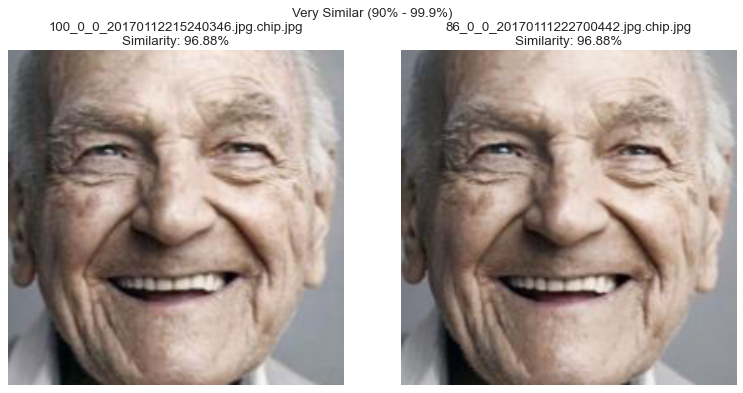

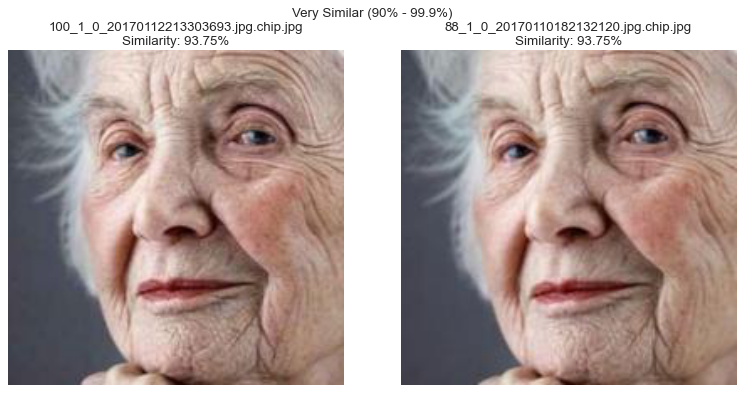

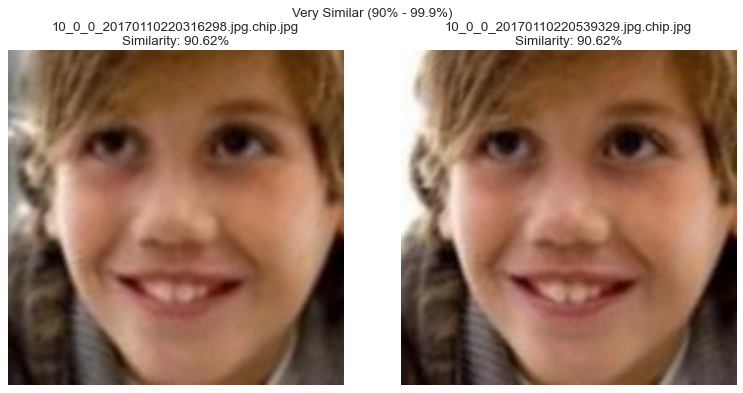

Displaying images for: Similar (75% - 89.9%)


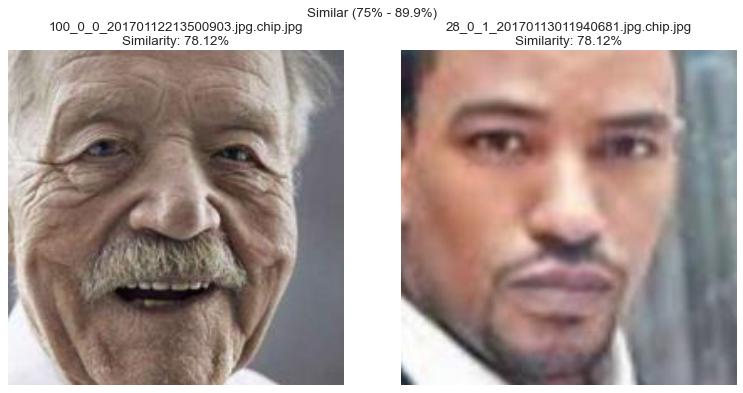

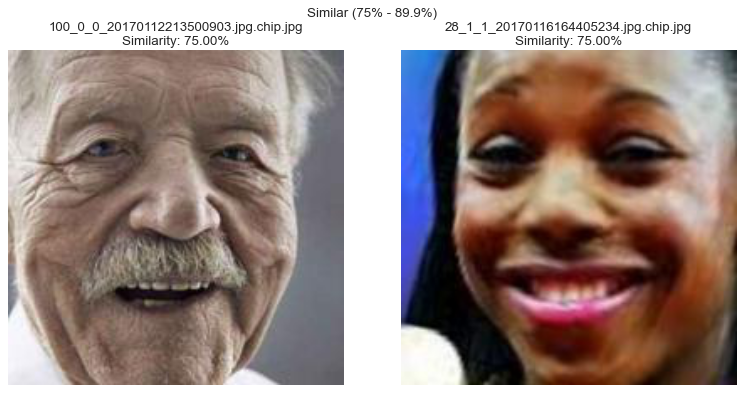

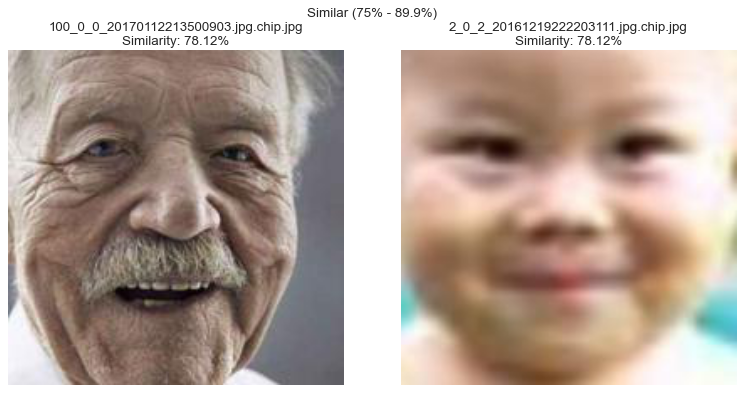

Displaying images for: Somewhat Similar (50% - 74.9%)


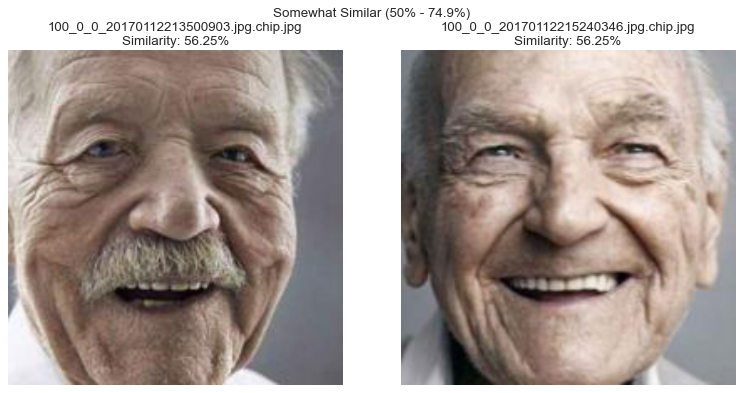

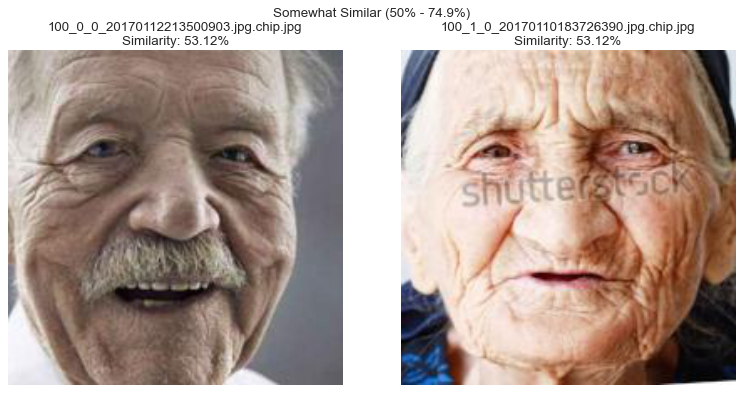

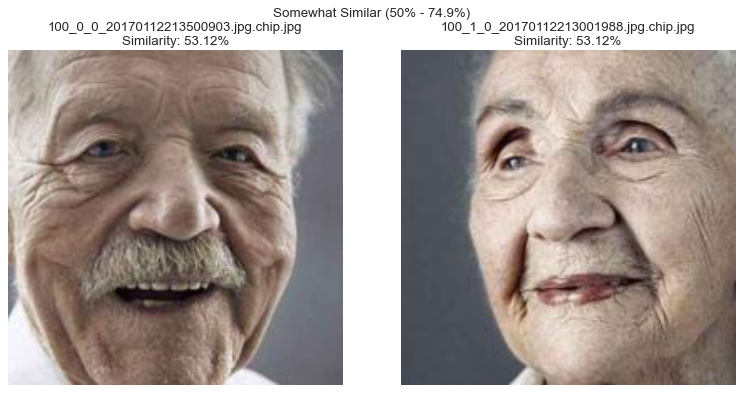

In [58]:
similarity_ranges = {
    "Very Similar (90% - 99.9%)": (90, 99.9),
    "Similar (75% - 89.9%)": (75, 89.9),
    "Somewhat Similar (50% - 74.9%)": (50, 74.9)
}

similar_images = find_similar_images_by_thresholds(folder_path, similarity_ranges)

for range_label, image_group in similar_images.items():
    if image_group:
        print(f"Displaying images for: {range_label}")
        display_similar_images(image_group[:3], folder_path, range_label)
    else:
        print(f"No images found for {range_label}")

1. Checking for Duplicates:
   - Started by listing all image filenames and used a counter to identify any duplicates. Fortunately, no repeated file names were found, which means our dataset did not contain exact file-level duplicates.
   - To further ensure that there weren't any duplicates at the pixel level, we used the Hamming distance. The distribution of Hamming distances between image pairs was computed and plotted. Most images had a relatively high distance, indicating that there were minimal duplicates or very closely matching images.

2. Identifying Identical Images:
   - Using a similarity-based function, identified a few identical images, where the same person was captured in what appears to be identical or very similar settings. 
   - Examples of identical images include a picture of an elderly man repeated twice and a young boy with slightly different lighting or positioning.

3. Finding Similar Images:
   - Also explored images with a similarity range from "Very Similar (90% - 99.9%)" to "Somewhat Similar (50% - 74.9%)".
   - Images labeled as "Very Similar" include pictures of individuals in nearly identical poses, lighting, or angles. For instance, we found an elderly woman with very similar facial expressions and lighting conditions.
   - "Similar" images shared some resemblance but had notable differences. For example, different individuals in similar postures or expressions were detected in this category, which suggests potential challenges for the model to distinguish between subtle variations.
   - "Somewhat Similar" images often included different individuals, but with facial features, expressions, or angles that bore some resemblance. This could potentially affect the generalization of the model, as it might confuse two distinct classes due to these visual similarities.

# Looking for Outliers

### 1. Face Detection using OpenCV (Haar Cascades)

This will flag images without faces as potential outliers.

In [73]:
non_face_images = flag_non_face_images(folder_path)
print("Non-face images detected:", non_face_images)

Non-face images detected: ['100_0_0_20170112213500903.jpg.chip.jpg', '100_1_0_20170112213001988.jpg.chip.jpg', '100_1_0_20170112215032192.jpg.chip.jpg', '100_1_0_20170117195420803.jpg.chip.jpg', '100_1_0_20170119212053665.jpg.chip.jpg', '100_1_2_20170105174847679.jpg.chip.jpg', '100_1_2_20170112213615815.jpg.chip.jpg', '101_0_0_20170112213500903.jpg.chip.jpg', '101_1_2_20170105174739309.jpg.chip.jpg', '103_0_2_20170112213001988.jpg.chip.jpg', '105_0_0_20170112213001988.jpg.chip.jpg', '105_1_0_20170112213001988.jpg.chip.jpg', '105_1_0_20170112213021902.jpg.chip.jpg', '105_1_0_20170112213507183.jpg.chip.jpg', '105_1_1_20170112213303693.jpg.chip.jpg', '10_0_0_20170103200329407.jpg.chip.jpg', '10_0_0_20170110215927291.jpg.chip.jpg', '10_0_0_20170110220251986.jpg.chip.jpg', '10_0_0_20170110220255346.jpg.chip.jpg', '10_0_0_20170110220403810.jpg.chip.jpg', '10_0_0_20170110220447314.jpg.chip.jpg', '10_0_0_20170110220503946.jpg.chip.jpg', '10_0_0_20170110220514186.jpg.chip.jpg', '10_0_0_2017011

### 2. Autoencoder for Outlier Detection

This uses an autoencoder to flag images that it struggles to reconstruct, indicating potential outliers.

In [74]:
def build_autoencoder(input_shape=(200, 200, 3)):
    input_img = layers.Input(shape=input_shape)

    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    decoded = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='mse')

    return autoencoder

def load_images_for_autoencoder(folder_path, image_size=(200, 200)):
    images = []
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.jpg') or file_name.endswith('.png'):
            file_path = os.path.join(folder_path, file_name)
            img = load_img(file_path, target_size=image_size)
            img_array = img_to_array(img) / 255.0
            images.append(img_array)
    
    return np.array(images)

images = load_images_for_autoencoder(folder_path)
autoencoder = build_autoencoder()

autoencoder.fit(images, images, epochs=10, batch_size=32)

reconstructions = autoencoder.predict(images)
mse = np.mean(np.power(images - reconstructions, 2), axis=(1, 2, 3))

threshold = np.percentile(mse, 95) 
outlier_indices = np.where(mse > threshold)[0]

outlier_images = [os.listdir(folder_path)[i] for i in outlier_indices]
print("Outlier images based on reconstruction error:", outlier_images)

Epoch 1/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 103s 135ms/step - loss: 0.0080
Epoch 2/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 100s 135ms/step - loss: 3.7216e-04
Epoch 3/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 104s 141ms/step - loss: 2.8935e-04
Epoch 4/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 99s 133ms/step - loss: 2.5153e-04
Epoch 5/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 99s 134ms/step - loss: 2.2103e-04
Epoch 6/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 100s 135ms/step - loss: 2.0781e-04
Epoch 7/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 100s 135ms/step - loss: 1.9366e-04
Epoch 8/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 98s 133ms/step - loss: 1.8102e-04
Epoch 9/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 103s 139ms/step - loss: 1.8488e-04
Epoch 10/10
741/741 ━━━━━━━━━━━━━━━━━━━━ 106s 143ms/step - loss: 1.6602e-04
741/741 ━━━━━━━━━━━━━━━━━━━━ 39s 52ms/step
Outlier images based on reconstruction error: ['100_0_0_20170112213500903.jpg.chip.jpg', '100_0_0_20170112215240346.jpg.chip.jpg', '100_1_0_20170110183726390.jpg.chip.jpg', '100_1_0_20170112213001988.jpg.chip.jpg'

### 3. Color Histogram for Outlier Detection

Identifies unusual color distributions that may indicate non-realistic images.

In [76]:
def compute_color_histogram(image_path, bins=(8, 8, 8)):
    img = io.imread(image_path)
    hist, _ = np.histogramdd(img.reshape(-1, 3), bins=bins, range=((0, 255), (0, 255), (0, 255)))
    hist = hist / np.sum(hist)  
    return hist.flatten()

def detect_color_histogram_outliers(folder_path, threshold=0.05, batch_size=100):
    file_list = [file_name for file_name in os.listdir(folder_path) if file_name.endswith('.jpg') or file_name.endswith('.png')]
    
    histograms = []
    for file_name in file_list:
        file_path = os.path.join(folder_path, file_name)
        hist = compute_color_histogram(file_path)
        histograms.append(hist)
    
    histograms = np.array(histograms)
    
    outliers = []
    n = len(histograms)
    
    for i in range(0, n, batch_size):
        batch_hist = histograms[i:i+batch_size]
        distances = pairwise_distances(batch_hist, histograms)
        
        for j, distance in enumerate(distances.mean(axis=1)):
            if distance > threshold:
                outliers.append(file_list[i + j]) 
                
    return outliers

color_outliers = detect_color_histogram_outliers(folder_path, threshold=0.05, batch_size=100)
print("Outlier images based on color histogram:", color_outliers)

Outlier images based on color histogram: ['100_0_0_20170112213500903.jpg.chip.jpg', '100_0_0_20170112215240346.jpg.chip.jpg', '100_1_0_20170110183726390.jpg.chip.jpg', '100_1_0_20170112213001988.jpg.chip.jpg', '100_1_0_20170112213303693.jpg.chip.jpg', '100_1_0_20170112215032192.jpg.chip.jpg', '100_1_0_20170117195420803.jpg.chip.jpg', '100_1_0_20170119212053665.jpg.chip.jpg', '100_1_2_20170105174847679.jpg.chip.jpg', '100_1_2_20170112213615815.jpg.chip.jpg', '100_1_2_20170112222336458.jpg.chip.jpg', '101_0_0_20170112213500903.jpg.chip.jpg', '101_1_2_20170105174739309.jpg.chip.jpg', '103_0_2_20170112213001988.jpg.chip.jpg', '105_0_0_20170112213001988.jpg.chip.jpg', '105_1_0_20170112213001988.jpg.chip.jpg', '105_1_0_20170112213021902.jpg.chip.jpg', '105_1_0_20170112213507183.jpg.chip.jpg', '105_1_1_20170112213303693.jpg.chip.jpg', '10_0_0_20161220222308131.jpg.chip.jpg', '10_0_0_20170103200329407.jpg.chip.jpg', '10_0_0_20170103200522151.jpg.chip.jpg', '10_0_0_20170103233459275.jpg.chip.jp

###  4. HOG Feature Extraction for Texture Analysis

Using HOG features can help differentiate between textures of drawings or unusual patterns compared to human faces.

In [78]:
hog_outliers = detect_hog_outliers(folder_path, threshold=0.05, batch_size=100)
print("Outlier images based on HOG features:", hog_outliers)

Outlier images based on HOG features: ['100_0_0_20170112213500903.jpg.chip.jpg', '100_0_0_20170112215240346.jpg.chip.jpg', '100_1_0_20170110183726390.jpg.chip.jpg', '100_1_0_20170112213001988.jpg.chip.jpg', '100_1_0_20170112213303693.jpg.chip.jpg', '100_1_0_20170112215032192.jpg.chip.jpg', '100_1_0_20170117195420803.jpg.chip.jpg', '100_1_0_20170119212053665.jpg.chip.jpg', '100_1_2_20170105174847679.jpg.chip.jpg', '100_1_2_20170112213615815.jpg.chip.jpg', '100_1_2_20170112222336458.jpg.chip.jpg', '101_0_0_20170112213500903.jpg.chip.jpg', '101_1_2_20170105174739309.jpg.chip.jpg', '103_0_2_20170112213001988.jpg.chip.jpg', '105_0_0_20170112213001988.jpg.chip.jpg', '105_1_0_20170112213001988.jpg.chip.jpg', '105_1_0_20170112213021902.jpg.chip.jpg', '105_1_0_20170112213507183.jpg.chip.jpg', '105_1_1_20170112213303693.jpg.chip.jpg', '10_0_0_20161220222308131.jpg.chip.jpg', '10_0_0_20170103200329407.jpg.chip.jpg', '10_0_0_20170103200522151.jpg.chip.jpg', '10_0_0_20170103233459275.jpg.chip.jpg',

# Visually Inspecting outliers

In [79]:
image_names = list(set(non_face_images + outlier_images + color_outliers + hog_outliers))

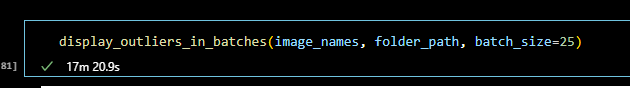

I performed a visual inspection of the dataset to identify and remove images that didn't belong for various reasons, such as incorrect labels, non-human content, or blurry images.

1. **Identifying Outliers**:
   - I utilized an automated script that identified outlier images based on factors like sharpness, color, and histogram of gradients (HOG) features.
   - These images were then displayed in batches for manual inspection to verify if they were suitable for my project. Due to the size of the dataset, this took approximately 17 minutes, as shown in the screenshot above.
   - Since the output generated a large volume of images, the notebook file became impossible to save. I had to delete the output from the notebook for this reason.

2. **Manual Verification and Deletion**:
   - After viewing all the outlier batches, I created a list of images that did not fit the criteria for different reasons.
   - The identified images fell into multiple categories:
     - **Incorrect Age Labels**: Images where the age label did not match the visible age.
     - **Incorrect Gender Labels**: Images where the gender label didn't align with the appearance of the subject.
     - **Incorrect Content**: Images that contained non-human content, such as sketches, paintings, or other irrelevant images.
     - **Images Without Explicit Label Issues**: Miscellaneous images with unusual content that didn't fit into any specific category.
   - After categorizing the images, I proceeded to delete them from the dataset to improve the quality and consistency of the model’s training data.

This process ensured that only the highest quality, properly labeled images were included in the final dataset, thereby reducing the noise that could negatively impact model performance.

In [82]:
incorrect_age_images = [
    "2_0_0_20170104201100490.jpg.chip.jpg",  # not a 2 yr old
    "17_1_0_20170113210605193.jpg.chip.jpg",  # not a 17 yr old
    "21_0_4_20161223214833090.jpg.chip.jpg",  # not a 21 yr old
    "21_0_4_20161223214821265.jpg.chip.jpg",  # not a 21 yr old
    "21_0_4_20161223214834033.jpg.chip.jpg",  # not a 21 yr old
    "21_0_4_20161223214834745.jpg.chip.jpg",  # not a 21 yr old
    "21_0_4_20161223214826657.jpg.chip.jpg",  # not a 21 yr old
]

incorrect_male_images = [ # not men
    "23_0_1_20170114030131616.jpg.chip.jpg",
    "23_0_3_20170117144200145.jpg.chip.jpg",
    "23_0_4_20170117194102020.jpg.chip.jpg",
    "24_0_1_20170117194551093.jpg.chip.jpg", 
    "24_0_2_20170116170600895.jpg.chip.jpg", 
    "24_0_4_20170117194540395.jpg.chip.jpg", 
    "25_0_0_20170116213542860.jpg.chip.jpg", 
    "25_0_0_20170117151036947.jpg.chip.jpg", 
    "25_0_4_20170117151414412.jpg.chip.jpg",
    "25_0_4_20170117151003346.jpg.chip.jpg",
    "25_0_4_20170117195058860.jpg.chip.jpg",
    "26_0_0_20170113210127410.jpg.chip.jpg", 
    "26_0_0_20170117200559815.jpg.chip.jpg",
    "26_0_0_20170117201133309.jpg.chip.jpg",
    "26_0_4_20170117200102299.jpg.chip.jpg", 
    "26_0_4_20170117200550222.jpg.chip.jpg", 
    "27_0_2_20170116172745659.jpg.chip.jpg",
    "27_0_3_20170117151048707.jpg.chip.jpg",
    "28_0_0_20170113210127446.jpg.chip.jpg", 
    "30_0_0_20170117151331469.jpg.chip.jpg",
    "30_0_0_20170117153441021.jpg.chip.jpg",
    "30_0_1_20170117194500557.jpg.chip.jpg", 
    "30_0_2_20170116172833941.jpg.chip.jpg",
    "30_0_4_20170117154305388.jpg.chip.jpg", 
    "30_0_4_20170117194418932.jpg.chip.jpg", 
    "30_0_4_20170117202929576.jpg.chip.jpg", 
    "31_0_0_20170116191337484.jpg.chip.jpg",
    "31_0_1_20170116010634833.jpg.chip.jpg", 
    "32_0_0_20170116201315769.jpg.chip.jpg", 
    "33_0_4_20170117202448894.jpg.chip.jpg",
    "34_0_0_20170117182649925.jpg.chip.jpg",
    "35_0_0_20170117185333778.jpg.chip.jpg",
    "35_0_4_20170117204532088.jpg.chip.jpg", 
    "36_0_0_20170117183240678.jpg.chip.jpg", 
    "36_0_3_20170119180245724.jpg.chip.jpg", 
    "37_0_3_20170119192309233.jpg.chip.jpg", 
    "46_0_4_20170117171327063.jpg.chip.jpg", 
    "54_0_2_20170109010628431.jpg.chip.jpg",
    "55_0_0_20170116232628323.jpg.chip.jpg", 
    "55_0_0_20170117135302098.jpg.chip.jpg"
]

incorrect_female_images = [ # not women
    "23_1_3_20170117144716562.jpg.chip.jpg",
    "24_1_2_20170116222629764.jpg.chip.jpg",
    "25_1_3_20170117142157226.jpg.chip.jpg",
    "26_1_0_20170113210126901.jpg.chip.jpg",
    "26_1_0_20170113210127127.jpg.chip.jpg",
    "26_1_0_20170113210605016.jpg.chip.jpg",
    "26_1_0_20170113210605337.jpg.chip.jpg",
    "26_1_0_20170116164344661.jpg.chip.jpg",
    "26_1_1_20170113135610650.jpg.chip.jpg",
    "26_1_1_20170116182045931.jpg.chip.jpg",
    "26_1_2_20170116182219997.jpg.chip.jpg",
    "27_1_1_20170117000109588.jpg.chip.jpg",
    "32_1_0_20170113210605443.jpg.chip.jpg",
    "32_1_2_20170105173433822.jpg.chip.jpg",
    "33_1_1_20170117173927950.jpg.chip.jpg",
    "39_1_4_20170117203758344.jpg.chip.jpg",
    "54_1_1_20170120223626558.jpg.chip.jpg",
    "60_1_0_20170117174613438.jpg.chip.jpg",
    "61_1_3_20170119211928409.jpg.chip.jpg",
    "68_1_0_20170113210319664.jpg.chip.jpg",
    "71_1_0_20170117194649889.jpg.chip.jpg",
    "71_1_1_20170117194632791.jpg.chip.jpg",
    "72_1_0_20170104213629773.jpg.chip.jpg" 
]

incorrect_content_images = [
    "28_0_0_20170113210605140.jpg.chip.jpg",  # video game character?
    "25_1_3_20170119171206287.jpg.chip.jpg"  # side profile
]

no_label_issue_images = [
    "1_0_0_20170109193052283.jpg.chip.jpg",
    "1_0_0_20170109194120301.jpg.chip.jpg",
    "1_1_0_20170109190852630.jpg.chip.jpg",
    "1_1_0_20170109194452834.jpg.chip.jpg",
    "1_1_4_20170109194502921.jpg.chip.jpg",
    "18_0_1_20170113175821404.jpg.chip.jpg",
    "21_1_0_20170116215627769.jpg.chip.jpg",
    "26_0_0_20170113210127170.jpg.chip.jpg",
    "26_0_0_20170113210127179.jpg.chip.jpg",
    "26_0_0_20170113210127287.jpg.chip.jpg",
    "28_0_1_20170117020012900.jpg.chip.jpg",
    "28_0_1_20170117202336846.jpg.chip.jpg",
    "33_0_0_20170113210319548.jpg.chip.jpg",
    "37_0_1_20170117134417970.jpg.chip.jpg",
    "72_0_0_20170111222516126.jpg.chip.jpg",
    "74_0_0_20170111221942118.jpg.chip.jpg",
    "76_0_1_20170116205556715.jpg.chip.jpg",
    "80_0_2_20170111210646563.jpg.chip.jpg",
    "86_1_2_20170105174652949.jpg.chip.jpg",
    "90_0_0_20170111210338948.jpg.chip.jpg",
]

# Displaying Found Outliers

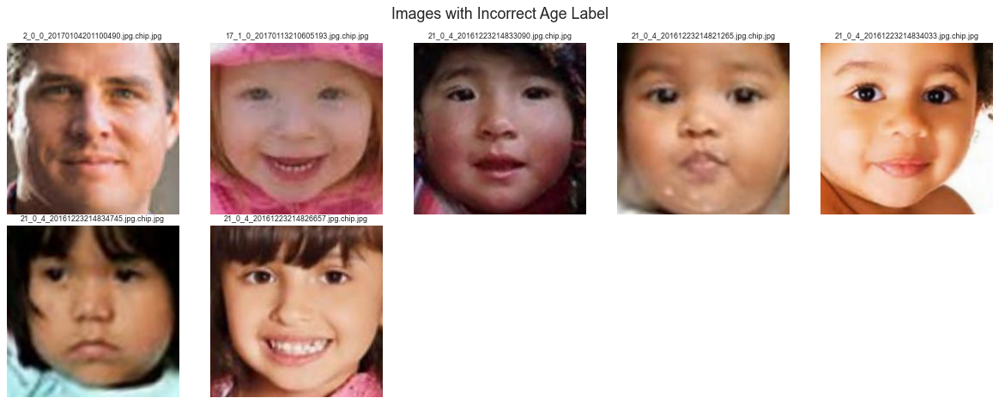

In [84]:
display_images(incorrect_age_images, folder_path, "Images with Incorrect Age Label")

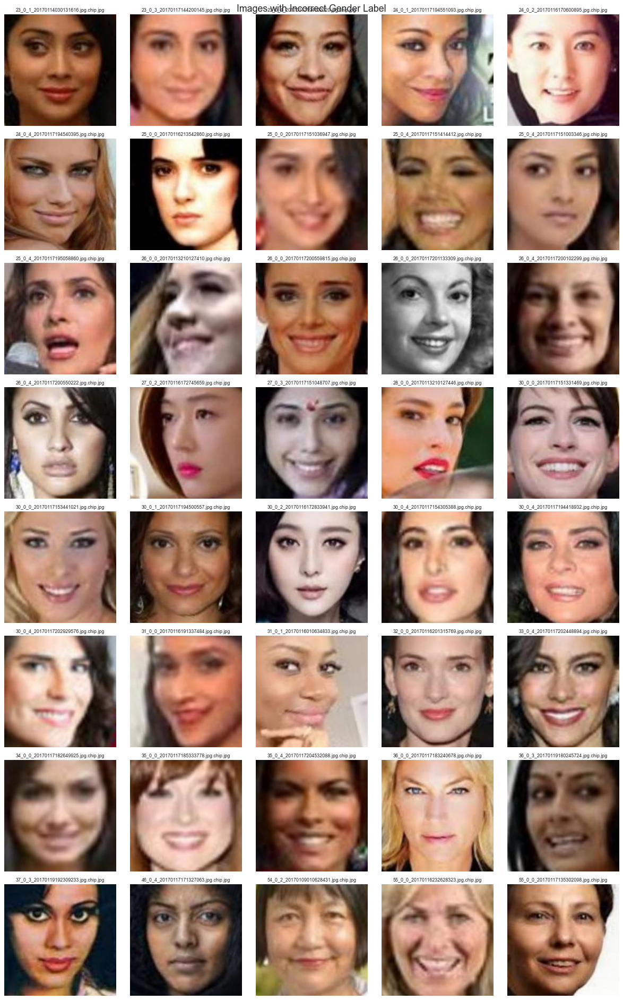

In [86]:
display_images(incorrect_male_images, folder_path, "Images with Incorrect Gender Label")

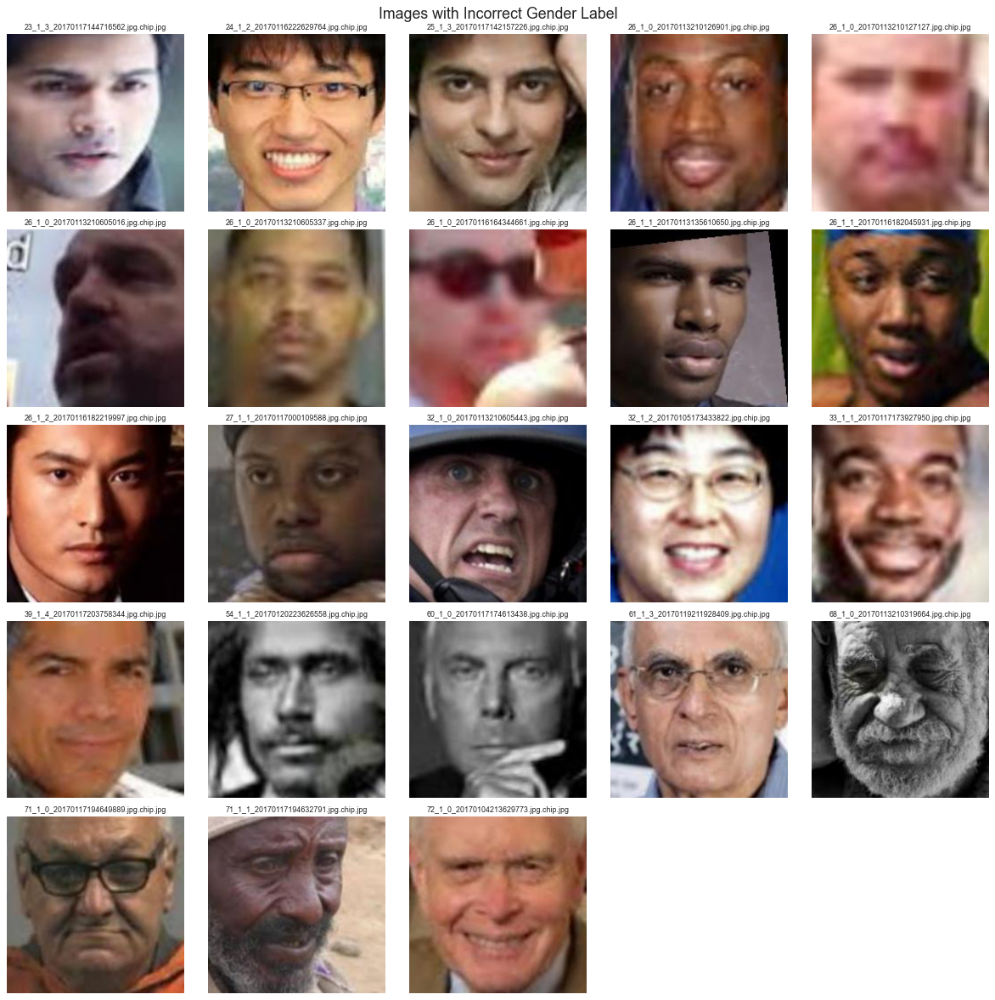

In [87]:
display_images(incorrect_female_images, folder_path, "Images with Incorrect Gender Label")

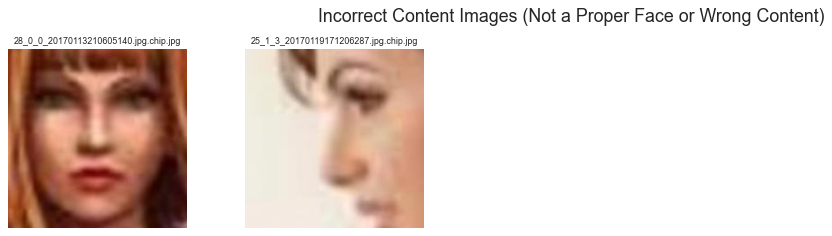

In [88]:
display_images(incorrect_content_images, folder_path, "Incorrect Content Images (Not a Proper Face or Wrong Content)")

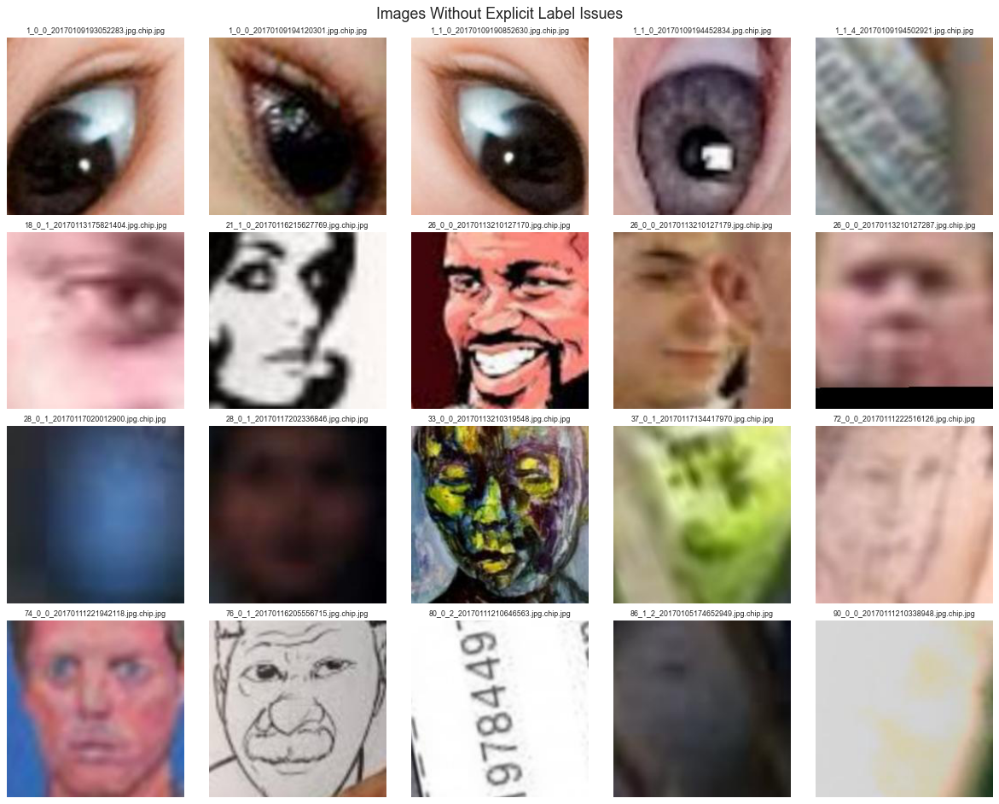

In [89]:
display_images(no_label_issue_images, folder_path, "Images Without Explicit Label Issues")

# Deleting Found outliers

In [90]:
def delete_images(image_list, folder_path):
    for image_name in image_list:
        img_path = os.path.join(folder_path, image_name)
        if os.path.exists(img_path):
            os.remove(img_path)
            print(f"Deleted: {img_path}")
        else:
            print(f"File not found: {img_path}")

delete_images(incorrect_age_images, folder_path)
delete_images(incorrect_male_images, folder_path)
delete_images(incorrect_female_images, folder_path)
delete_images(incorrect_content_images, folder_path)
delete_images(no_label_issue_images, folder_path)

Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\2_0_0_20170104201100490.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\17_1_0_20170113210605193.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\21_0_4_20161223214833090.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\21_0_4_20161223214821265.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\21_0_4_20161223214834033.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\21_0_4_20161223214834745.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\21_0_4_20161223214826657.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\23_0_1_20170114030131616.jpg.chip.jpg
Deleted: C:\Users\Liberty\Desktop\CodingP

In [91]:
def count_images(folder_path):
    image_files = [file for file in os.listdir(folder_path) if file.endswith(('.jpg', '.jpeg', '.png'))]
    return len(image_files)

num_images = count_images(folder_path)
print(f"Number of images in the folder: {num_images}")

Number of images in the folder: 23608


It's important to delete the pictures that were misgendered rather than attempting to fix them because correcting the gender label alone does not guarantee the accuracy of the remaining attributes, particularly the age. The age labels might also be incorrect, leading to inconsistencies that could negatively affect the model's performance and introduce bias. Mislabelled data, even if partially corrected, can significantly degrade the quality of the dataset, causing the model to learn inaccurate or misleading patterns. Therefore, it's safer to remove these images entirely to maintain the integrity of the training data and ensure that the model is learning from accurately labeled examples.

# Searching for Duplicates

After running the script to identify 100% visually similar images, a total of 620 duplicate pairs were found. These duplicates were verified through random sampling, and upon confirmation, the duplicates were successfully deleted, leaving only one version of each pair. Interestingly, when checking for duplicates based on file names, no repeated names were found, indicating that all detected duplicates were visually similar, but had unique file names.

Total number of 100% similar (duplicate) pairs found: 607
Displaying pair: 23_1_0_20170103180451856.jpg.chip.jpg and 30_1_0_20170117135257534.jpg.chip.jpg


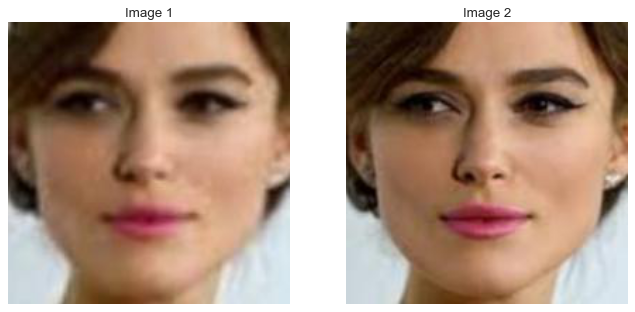

Displaying pair: 24_1_2_20170116171002640.jpg.chip.jpg and 27_1_2_20170116171613640.jpg.chip.jpg


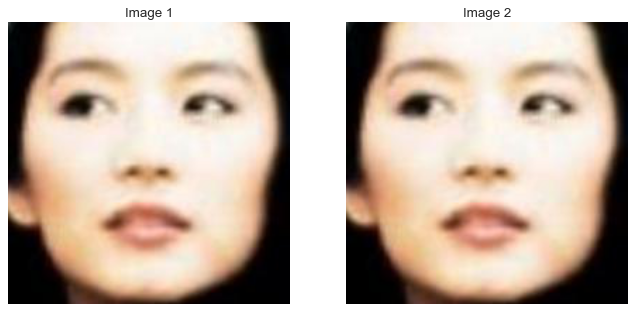

Displaying pair: 1_1_1_20161219155940125.jpg.chip.jpg and 1_1_3_20161220143239294.jpg.chip.jpg


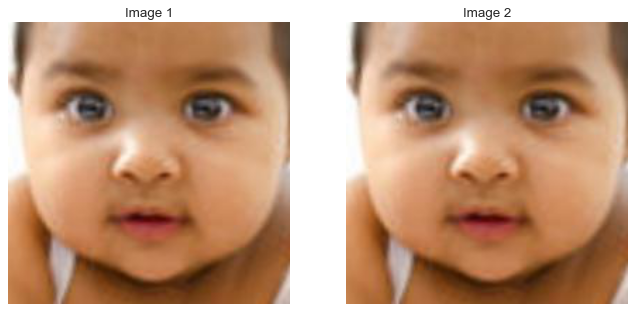

In [92]:
duplicates = find_exact_duplicates(folder_path)

In [8]:
delete_duplicates(duplicates, folder_path)

Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\11_1_0_20170109204611305.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\12_1_0_20170109212505669.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\13_0_0_20170110232519225.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\13_1_0_20170109204325267.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\13_1_0_20170109213526011.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\14_0_0_20170110232651186.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\14_1_0_20170109204620092.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\CodingProjects\deep learning - sprint 3\UTKFace\14_1_0_20170109212753539.jpg.chip.jpg
Deleting C:\Users\Liberty\Desktop\Coding